<a href="https://colab.research.google.com/github/dsgaldino/Metodos_Analiticos_Redes_Sociais/blob/main/transporte_cwb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tarefa Final

## Métodos Analíticos para Redes Sociais

***Aluno:*** Diego Soares Galdino

***Prof.:*** Marcelo de Oliveira Rosa


### Bibiliotecas

In [1]:
install.packages("igraph")
library(igraph)

install.packages("ggmap")
library(ggmap)

install.packages("geosphere")
library(geosphere)

install.packages("MASS")
library(MASS)

install.packages("dplyr")
library(dplyr)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘sp’, ‘Rcpp’, ‘RgoogleMaps’, ‘png’, ‘plyr’, ‘jpeg’, ‘bitops’


Loading required package: ggplot2

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

ℹ Google's Terms of Service: <https://mapsplatform.g

### Rede complexa de sistemas de transporte urbano de Curitiba


In [9]:
# Leitura da Rede
load("Rede complexa do sistema de transporte urbano de Curitiba.R")

In [10]:
# get bus line information
df_lines <- data.frame(index = numeric(length(all_bus_info)),
                    code = character(length(all_bus_info)),
                    name = character(length(all_bus_info)),
                    cat = character(length(all_bus_info)),
                    stringsAsFactors = FALSE)

for (i in 1:length(all_bus_info)) {
                                df_lines$index[i] <- i
                                df_lines$code[i] <- all_bus_info[[i]][[1]]
                                df_lines$name[i] <- all_bus_info[[i]][[2]]
                                df_lines$cat[i] <- all_bus_info[[i]][[3]]
                                }

In [11]:
# get bus stop information
df_all_stops <- data.frame(num = character(0),
                            lat = numeric(0),
                            lon = numeric(0),
                            group = character(0),
                            cat = character(0),
                            stringsAsFactors = FALSE)

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    a_line_code <- all_bus_info[[i]][[1]]

    for (j in 1:num_of_directions) {
        total_stops <- nrow(all_bus_info[[i]][[4]][[j]][[2]])

        df_sub <- data.frame(num = character(total_stops),
                            lat = numeric(total_stops),
                            lon = numeric(total_stops),
                            group = character(total_stops),
                            cat = character(total_stops),
                            stringsAsFactors = FALSE)

        df_sub$num <- all_bus_info[[i]][[4]][[j]][[2]]$NUM
        df_sub$lat <- all_bus_info[[i]][[4]][[j]][[2]]$LAT
        df_sub$lon <- all_bus_info[[i]][[4]][[j]][[2]]$LON
        df_sub$group <- all_bus_info[[i]][[4]][[j]][[2]]$GRUPO

        df_sub$cat <- df_lines[df_lines$code==a_line_code,]$cat
        df_all_stops <- rbind(df_all_stops, df_sub)
        }
    }
# removing repetition
df_all_stops <- df_all_stops[!duplicated(df_all_stops$num), ]

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



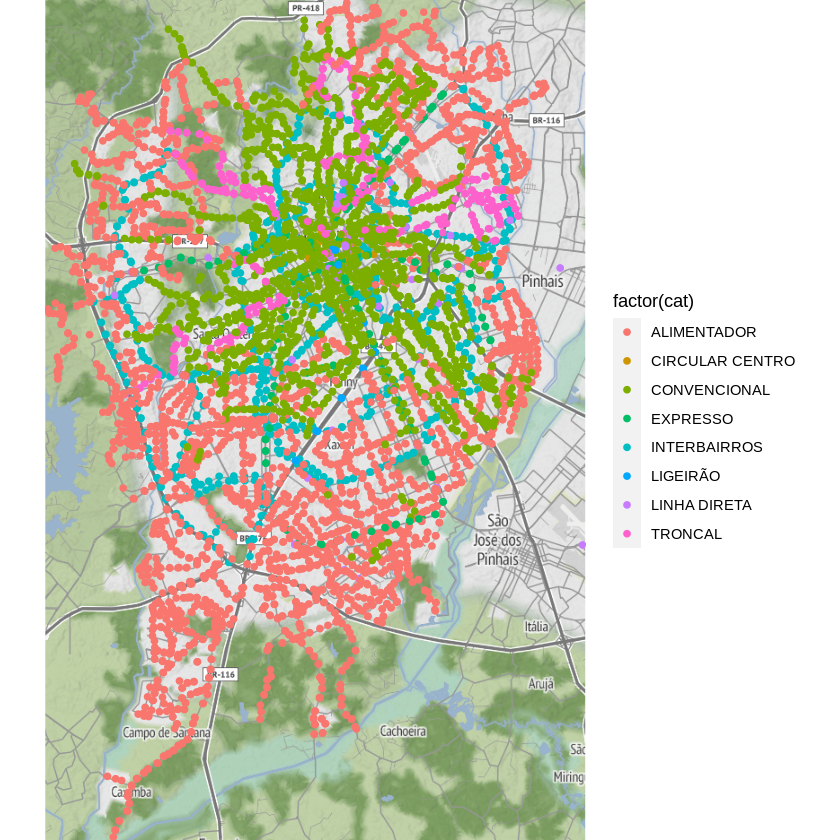

In [12]:
# plotting
a_delta = 0.001

city_region <- c(
    left = min(df_all_stops$lon)-a_delta,
    top = max(df_all_stops$lat)+a_delta,
    right = max(df_all_stops$lon)+a_delta,
    bottom = min(df_all_stops$lat)-a_delta)

my_curitiba_v11 <- get_map(location = city_region, zoom = 12, source='stamen')

ggmap(my_curitiba_v11, extent = 'device') +
    geom_point(aes(x = lon, y = lat, color = factor(cat)), data = df_all_stops)

In [13]:
curitiba_l <- make_empty_graph(directed = FALSE)

df_empty <- data.frame(from = character(0),
                      to = character(0))

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    df_stops_per_line <- df_empty

    for (j in 1:num_of_directions) {
        paste(i)
        a_df <- all_bus_info[[i]][[4]][[j]][[2]]
        total_stops <- nrow(a_df)
        df_sub <- data.frame(from = a_df$NUM[1:nrow(a_df) - 1],
        to = a_df$NUM[-1])
        df_stops_per_line <- rbind(df_stops_per_line, df_sub)
    }

    curitiba_l <- curitiba_l +
        graph_from_data_frame(df_stops_per_line, directed = FALSE)
}

# feeding information of each vertex/bus stop
V(curitiba_l)[order(V(curitiba_l)$name)]$lat <- df_all_stops[order(df_all_stops$num),]$lat
V(curitiba_l)[order(V(curitiba_l)$name)]$lon <- df_all_stops[order(df_all_stops$num),]$lon
V(curitiba_l)[order(V(curitiba_l)$name)]$group <- df_all_stops[order(df_all_stops$num),]$group

# feeding distance (in meters) between edges
bus_stop_connection <- as_edgelist(curitiba_l)

idx_1 <- vapply(bus_stop_connection[,1],
               function(key) { which(df_all_stops$num==key) }, 0)

idx_2 <- vapply(bus_stop_connection[,2],
                function(key) { which(df_all_stops$num==key) }, 0)

E(curitiba_l)$weight <- distHaversine(
    cbind(df_all_stops$lon[idx_1], df_all_stops$lat[idx_1]),
    cbind(df_all_stops$lon[idx_2], df_all_stops$lat[idx_2]))

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.

ℹ 48 tiles needed, this may take a while (try a smaller zoom?)



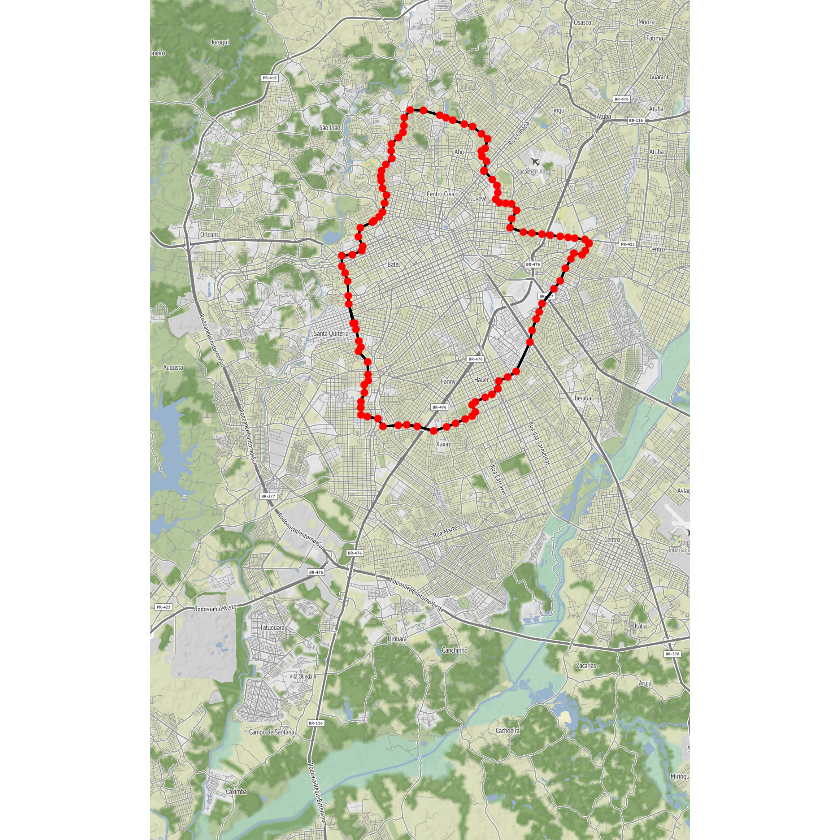

In [14]:
wanted_line_code = '020'

bus_line_graph_l <- make_empty_graph(directed = FALSE)

df_empty <- data.frame(from = character(0),
                       to = character(0))

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    a_line_code <- all_bus_info[[i]][[1]]

    if (a_line_code==wanted_line_code) {
        df_stops_per_line <- df_empty

        for (j in 1:num_of_directions) {
            a_df <- all_bus_info[[i]][[4]][[j]][[2]]
            total_stops <- nrow(a_df)
            df_sub <- data.frame(from = a_df$NUM[1:nrow(a_df) - 1],
                                   to = a_df$NUM[-1])
            df_stops_per_line <- rbind(df_stops_per_line, df_sub)
        }

        bus_line_graph_l <- graph_from_data_frame(df_stops_per_line, directed = FALSE)

        break;
    }
}

# feeding information of each vertex/bus stop
idx_1 <- vapply(V(bus_line_graph_l)$name, function(key) {
        which(df_all_stops$num==key) }, 0)

V(bus_line_graph_l)$lat <- df_all_stops$lat[idx_1]
V(bus_line_graph_l)$lon <- df_all_stops$lon[idx_1]
V(bus_line_graph_l)$group <- df_all_stops$group[idx_1]

# feeding distance (in meters) between edges
bus_stop_connection <- as_edgelist(bus_line_graph_l)

idx_1 <- vapply(bus_stop_connection[,1],
function(key) { which(df_all_stops$num==key) },0)

idx_2 <- vapply(bus_stop_connection[,2],
function(key) { which(df_all_stops$num==key) }, 0)

E(bus_line_graph_l)$weight <- distHaversine(

cbind(df_all_stops$lon[idx_1], df_all_stops$lat[idx_1]),
cbind(df_all_stops$lon[idx_2], df_all_stops$lat[idx_2]))

# plotting such a bus line
df_wanted_line_1 <- data.frame(lat = V(bus_line_graph_l)$lat,
                                lon = V(bus_line_graph_l)$lon)

df_wanted_line_2 <- data.frame(x = df_all_stops$lon[idx_1],
                                y = df_all_stops$lat[idx_1],
                                xend = df_all_stops$lon[idx_2],
                                yend = df_all_stops$lat[idx_2])

a_delta = 0.001

city_region <- c(
                left = min(df_all_stops$lon)-a_delta,
                top = max(df_all_stops$lat)+a_delta,
                right = max(df_all_stops$lon)+a_delta,
                bottom = min(df_all_stops$lat)-a_delta)

my_curitiba_v12 <- get_map(location = city_region, zoom = 13, source='stamen')

ggmap(my_curitiba_v12, extent = 'device') +
    geom_segment(aes(x = x, y = y, xend = xend, yend = yend),
                 data = df_wanted_line_2) +

geom_point(aes(x = lon, y = lat),
            data = df_wanted_line_1,
            color = 'red')


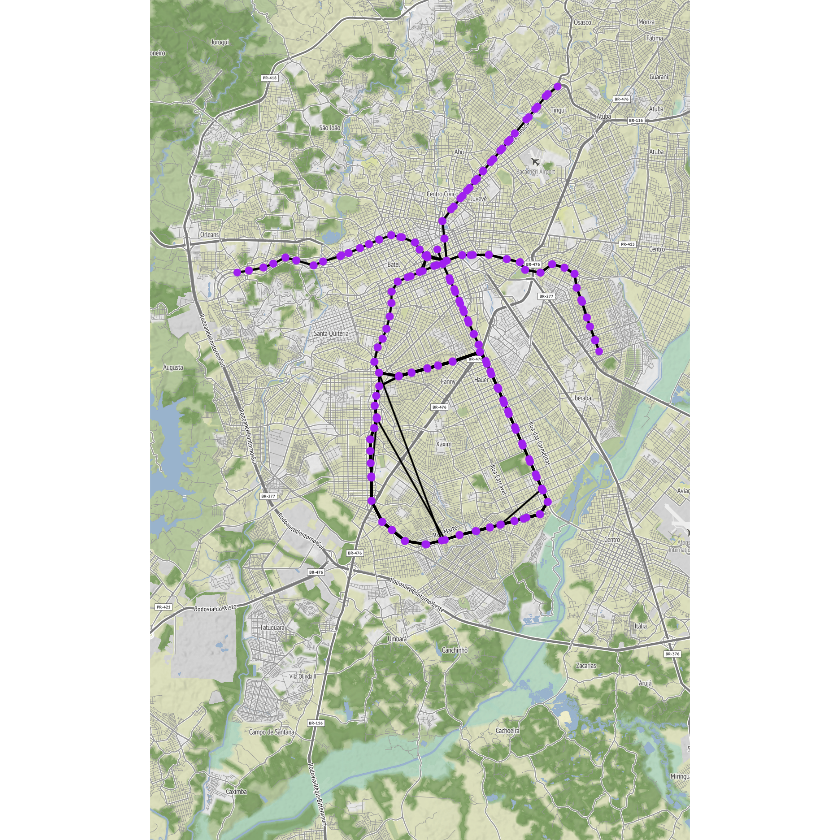

In [72]:
 wanted_category = 'EXPRESSO'
#wanted_category = 'ALIMENTADOR'

bus_line_graph_l <- make_empty_graph(directed = FALSE)

df_empty <- data.frame(from = character(0),
                       to = character(0))

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    a_wanted_category <- all_bus_info[[i]][[3]]

    if (a_wanted_category==wanted_category) {
        df_stops_per_line <- df_empty

        for (j in 1:num_of_directions) {
            a_df <- all_bus_info[[i]][[4]][[j]][[2]]
            total_stops <- nrow(a_df)
            df_sub <- data.frame(from = a_df$NUM[1:nrow(a_df) - 1],
                                   to = a_df$NUM[-1])
            df_stops_per_line <- rbind(df_stops_per_line, df_sub)
        }

        bus_line_graph_l <- bus_line_graph_l +
        graph_from_data_frame(df_stops_per_line, directed = FALSE)
        }
    }

# feeding information of each vertex/bus stop
idx_1 <- vapply(V(bus_line_graph_l)$name,
    function(key) { which(df_all_stops$num==key) },
    0)

V(bus_line_graph_l)$lat <- df_all_stops$lat[idx_1]
V(bus_line_graph_l)$lon <- df_all_stops$lon[idx_1]
V(bus_line_graph_l)$group <- df_all_stops$group[idx_1]

# feeding distance (in meters) between edges
bus_stop_connection <- as_edgelist(bus_line_graph_l)

idx_1 <- vapply(bus_stop_connection[,1],
    function(key) { which(df_all_stops$num==key) },
    0)

idx_2 <- vapply(bus_stop_connection[,2],
    function(key) { which(df_all_stops$num==key) },
    0)

E(bus_line_graph_l)$weight <- distHaversine(

cbind(df_all_stops$lon[idx_1], df_all_stops$lat[idx_1]),
cbind(df_all_stops$lon[idx_2], df_all_stops$lat[idx_2]))

# plotting such a bus line
df_wanted_line_1 <- data.frame(lat = V(bus_line_graph_l)$lat,
                             lon = V(bus_line_graph_l)$lon)

df_wanted_line_2 <- data.frame(x = df_all_stops$lon[idx_1],
                            y = df_all_stops$lat[idx_1],
                            xend = df_all_stops$lon[idx_2],
                            yend = df_all_stops$lat[idx_2])

ggmap(my_curitiba_v12, extent = 'device') +
    geom_segment(aes(x = x, y = y, xend = xend, yend = yend),
    data = df_wanted_line_2) +
    geom_point(aes(x = lon, y = lat),
                data = df_wanted_line_1,
                color = 'purple')

### 1. Qual o ponto de ônibus mais “carregado”?

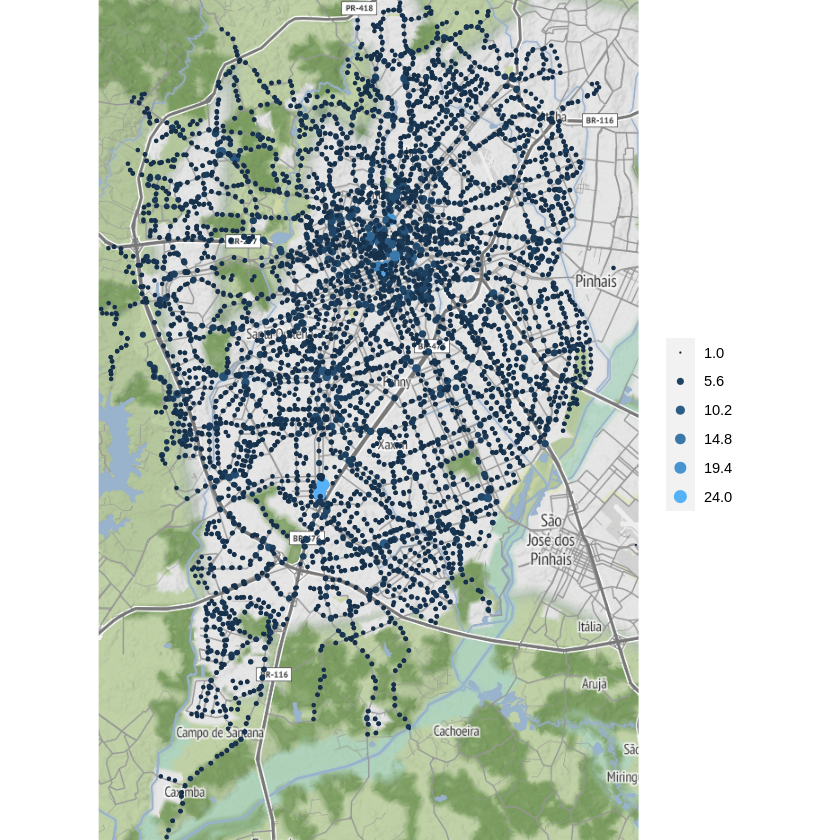

In [16]:
df_bus_stops <- data.frame(lat = V(curitiba_l)$lat,
                            lon = V(curitiba_l)$lon)

# remove 'simplify' to see what's happen!
ctba_degree <- degree(simplify(curitiba_l))
df_metrics <- df_bus_stops
df_metrics$value <- ctba_degree

my_break_function <- function(x) { seq(min(x), max(x), length.out = 6) }

ggmap(my_curitiba_v11, extent = 'device') +
    geom_point(data = df_metrics,
                aes(x = lon, y = lat,
                size = value, color = value)) +
    scale_size_continuous(range = c(0, 3),
                          breaks = my_break_function) +
    scale_color_gradient(breaks = my_break_function) +
    guides(size = guide_legend(title = NULL),
            color = guide_legend(title = NULL))

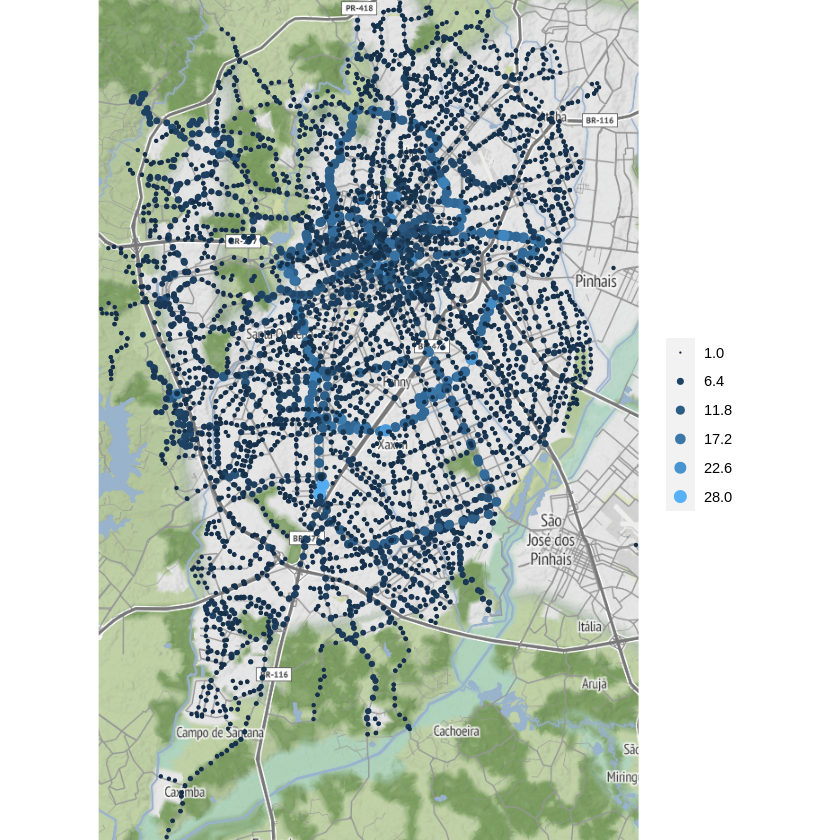

In [17]:
df_bus_stops <- data.frame(lat = V(curitiba_l)$lat,
                            lon = V(curitiba_l)$lon)

ctba_degree <- degree(curitiba_l)
df_metrics <- df_bus_stops
df_metrics$value <- ctba_degree

my_break_function <- function(x) { seq(min(x), max(x), length.out = 6) }

ggmap(my_curitiba_v11, extent = 'device') +
    geom_point(data = df_metrics,
                aes(x = lon, y = lat,
                size = value, color = value)) +
    scale_size_continuous(range = c(0, 3),
                          breaks = my_break_function) +
    scale_color_gradient(breaks = my_break_function) +
    guides(size = guide_legend(title = NULL),
            color = guide_legend(title = NULL))

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.

ℹ 48 tiles needed, this may take a while (try a smaller zoom?)



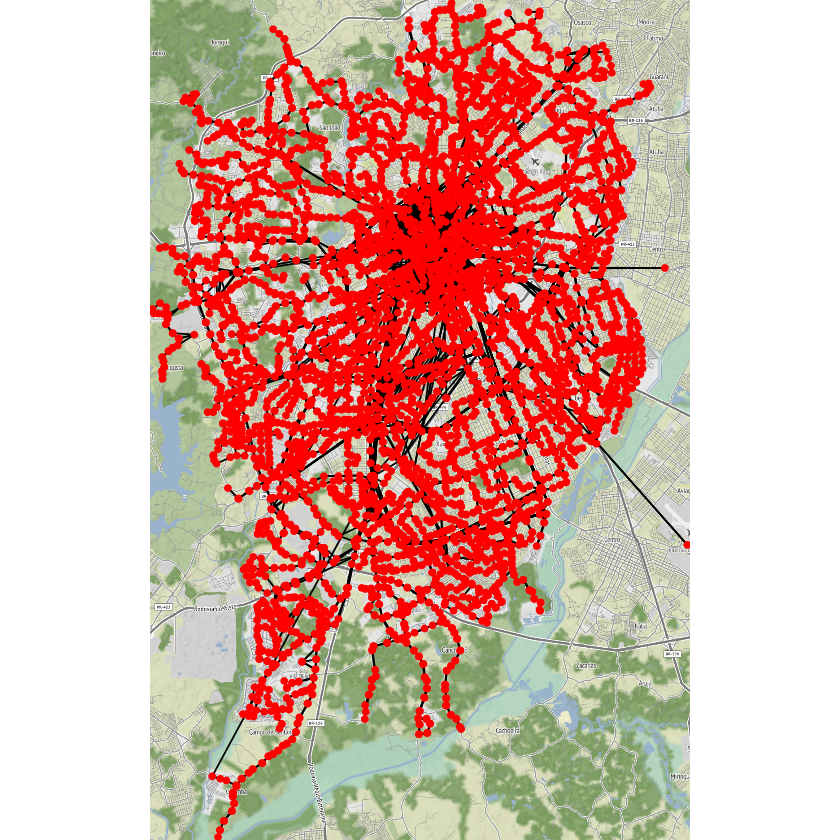

In [18]:
bus_line_graph_l <- make_empty_graph(directed = FALSE)
bus_line_sub_graph_l <- make_empty_graph(directed = FALSE)

df_empty <- data.frame(from = character(0),
                       to = character(0))

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    a_line_code <- all_bus_info[[i]][[1]]

    df_stops_per_line <- df_empty

    for (j in 1:num_of_directions) {
        a_df <- all_bus_info[[i]][[4]][[j]][[2]]
        total_stops <- nrow(a_df)
        df_sub <- data.frame(from = a_df$NUM[1:nrow(a_df) - 1],
                               to = a_df$NUM[-1])
        df_stops_per_line <- rbind(df_stops_per_line, df_sub)
    }

    bus_line_sub_graph_l <- graph_from_data_frame(df_stops_per_line, directed = FALSE)
    bus_line_graph_l <-bus_line_graph_l + bus_line_sub_graph_l
    # break;
}

# feeding information of each vertex/bus stop
idx_1 <- vapply(V(bus_line_graph_l)$name, function(key) {
        which(df_all_stops$num==key) }, 0)

V(bus_line_graph_l)$lat <- df_all_stops$lat[idx_1]
V(bus_line_graph_l)$lon <- df_all_stops$lon[idx_1]
V(bus_line_graph_l)$group <- df_all_stops$group[idx_1]

# feeding distance (in meters) between edges
bus_stop_connection <- as_edgelist(bus_line_graph_l)

idx_1 <- vapply(bus_stop_connection[,1],
function(key) { which(df_all_stops$num==key) },0)

idx_2 <- vapply(bus_stop_connection[,2],
function(key) { which(df_all_stops$num==key) }, 0)

E(bus_line_graph_l)$weight <- distHaversine(

cbind(df_all_stops$lon[idx_1], df_all_stops$lat[idx_1]),
cbind(df_all_stops$lon[idx_2], df_all_stops$lat[idx_2]))

# plotting such a bus line
df_wanted_line_1 <- data.frame(lat = V(bus_line_graph_l)$lat,
                                lon = V(bus_line_graph_l)$lon)

df_wanted_line_2 <- data.frame(x = df_all_stops$lon[idx_1],
                                y = df_all_stops$lat[idx_1],
                                xend = df_all_stops$lon[idx_2],
                                yend = df_all_stops$lat[idx_2])

a_delta = 0.001

city_region <- c(
                left = min(df_all_stops$lon)-a_delta,
                top = max(df_all_stops$lat)+a_delta,
                right = max(df_all_stops$lon)+a_delta,
                bottom = min(df_all_stops$lat)-a_delta)

my_curitiba_v12 <- get_map(location = city_region, zoom = 13, source='stamen')

ggmap(my_curitiba_v12, extent = 'device') +
    geom_segment(aes(x = x, y = y, xend = xend, yend = yend),
                 data = df_wanted_line_2) +

geom_point(aes(x = lon, y = lat),
            data = df_wanted_line_1,
            color = 'red')


In [19]:
df_dados_paradas <- data.frame(num = character(0),
                            nome = character(0),
                            lat = numeric(0),
                            lon = numeric(0),
                            group = character(0),
                            cat = character(0),
                            stringsAsFactors = FALSE)

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    a_line_code <- all_bus_info[[i]][[1]]

    for (j in 1:num_of_directions) {
        total_stops <- nrow(all_bus_info[[i]][[4]][[j]][[2]])

        df_sub1 <- data.frame(num = character(total_stops),
                            nome = character(total_stops),
                            lat = numeric(total_stops),
                            lon = numeric(total_stops),
                            group = character(total_stops),
                            cat = character(total_stops),
                            stringsAsFactors = FALSE)

        df_sub1$num <- all_bus_info[[i]][[4]][[j]][[2]]$NUM
        df_sub1$nome <- all_bus_info[[i]][[4]][[j]][[2]]$NOME
        df_sub1$lat <- all_bus_info[[i]][[4]][[j]][[2]]$LAT
        df_sub1$lon <- all_bus_info[[i]][[4]][[j]][[2]]$LON
        df_sub1$group <- all_bus_info[[i]][[4]][[j]][[2]]$GRUPO

        df_sub1$cat <- df_lines[df_lines$code==a_line_code,]$cat
        df_dados_paradas <- rbind(df_dados_paradas, df_sub1)
        }
    }
# removing repetition
df_dados_paradas <- df_dados_paradas[!duplicated(df_dados_paradas$num), ]
#df_dados_paradas <- df_dados_paradas[!duplicated(df_dados_paradas$nome), ]

In [20]:
which.max(ctba_degree)
ctba_degree['150331']

150331 
  4347

150331 
    28

In [21]:
df_dados_paradas[df_dados_paradas$num == '150331',]

,num,nome,lat,lon,group,cat
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
10424,150331,"Av. Winston Churchill, 2472 - Capão Raso",-25.51835,-49.29567,,ALIMENTADOR


### 2. Em média, os pontos de ônibus servem quantas linhas?

In [61]:
mean(ctba_degree)

summary(ctba_degree)

[1] 3.367347

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   2.000   3.367   4.000  28.000 

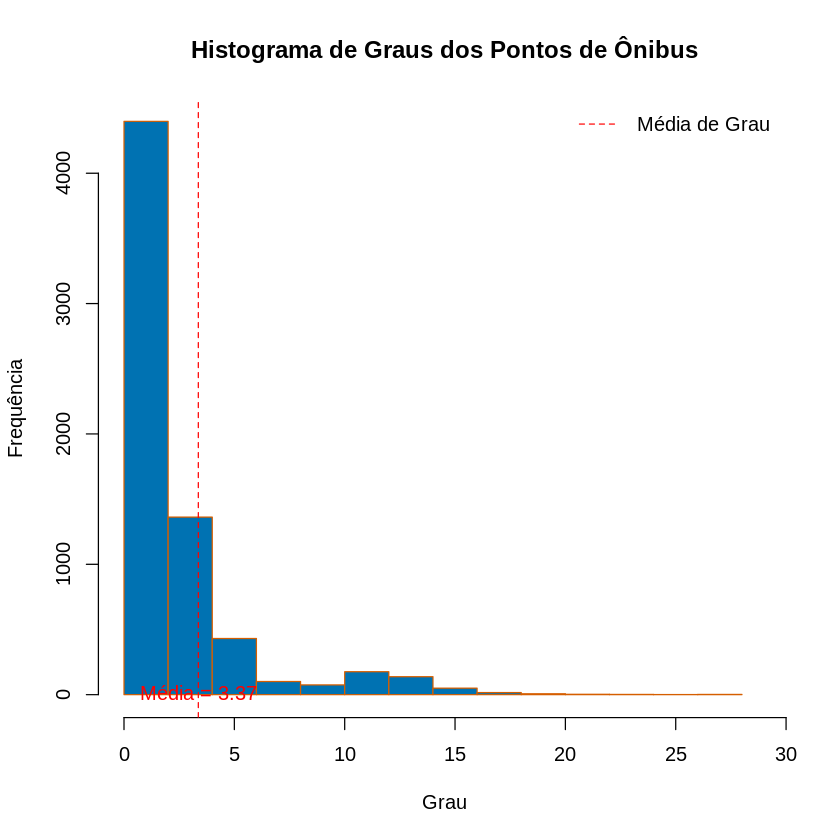

In [60]:
# Define cores personalizadas
hist_color <- "#0072B2"  # Azul
border_color <- "#D55E00"  # Laranja

# Plote o histograma com melhorias
hist(ctba_degree,
     col = hist_color,  # Cor das barras
     border = border_color,  # Cor das bordas das barras
     main = 'Histograma de Graus dos Pontos de Ônibus',  # Título principal
     xlab = 'Grau',  # Rótulo do eixo X
     ylab = 'Frequência',  # Rótulo do eixo Y
     xlim = c(0, max(ctba_degree) + 1)  # Limites do eixo X personalizados
)

# Adicione uma linha vertical para a média
avg_degree <- mean(ctba_degree)
abline(v = avg_degree, col = "red", lty = 2)  # Linha pontilhada vermelha
text(avg_degree, 20, paste("Média =", round(avg_degree, 2)), col = "red")

# Adicione uma legenda
legend("topright", legend = c("Média de Grau"), col = c("red"), lty = c(2), bty = "n")


### 3. Qual a distância média dos caminhos existentes (em KM)?

In [47]:
# Calcula a média da distância e imprime o resultado em quilômetros
cat("A maior distância é:", mean_distance(curitiba_l)/1000, "km\n")

A maior distância é: 14.10493 km


### 4. Localize graficamente o maior caminho existente (KM)
    a. Diâmetro da rede ponderada


In [62]:
# Calcula a média da distância e imprime o resultado em quilômetros
cat("O maior caminho existente é:", (diameter(curitiba_l))/1000, "km\n")

O maior caminho existente é: 42.88241 km


In [54]:
diameter_stops <- get_diameter(curitiba_l)

diameter_stops

+ 97/6762 vertices, named, from b966fd7:
 [1] 170414 170991 170410 170408 170406 170404 170582 170580 170578 170576
[11] 170574 170572 170570 170568 170566 170739 170563 170561 170559 170751
[21] 170556 170554 170738 170737 170550 170736 170546 170544 170910 170511
[31] 170509 170732 170500 170908 170380 170379 170378 160074 170121 160438
[41] 160078 170052 160245 150513 150515 150517 150520 150521 150523 150447
[51] 150446 150352 150351 150350 150329 150194 108204 108206 108208 108210
[61] 108211 108113 108115 108117 108119 108121 105802 108050 108048 108046
[71] 108044 108042 108040 108038 108036 108034 108032 108028 108025 108030
[81] 108173 108175 108178 108180 108182 108184 108186 108188 104505 108190
[91] 108192 108194 108196 108198 108200 108202 104601

ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.

ℹ 48 tiles needed, this may take a while (try a smaller zoom?)



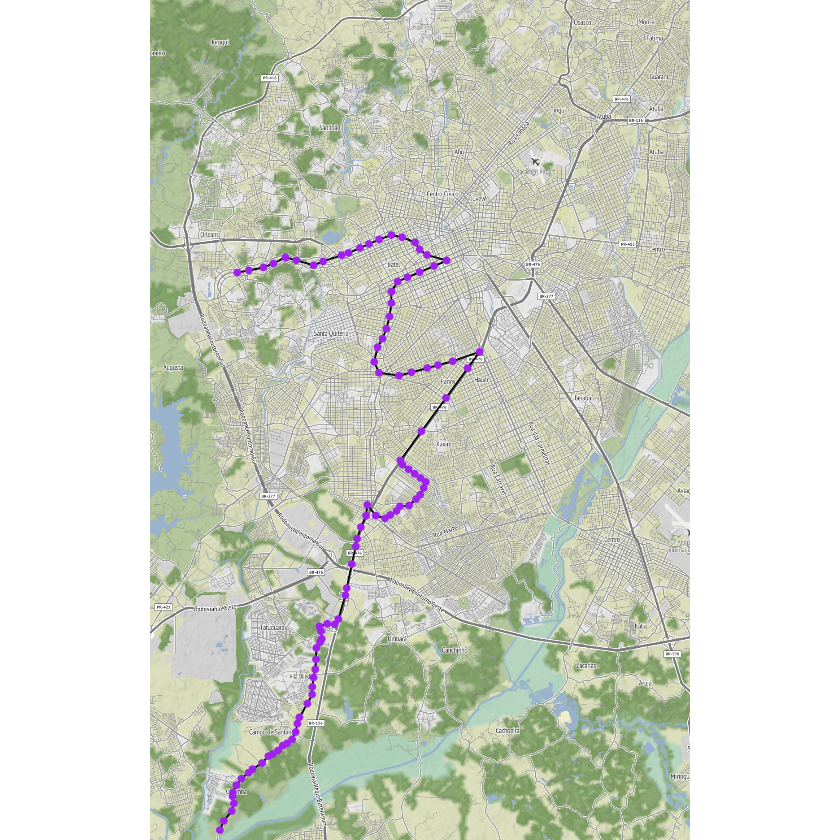

In [58]:
# Função para criar e visualizar o caminho mais longo da rede
create_and_visualize_longest_path <- function(graph, stops_data, delta = 0.001) {
    diameter_stops <- get_diameter(graph)

    # Monta a lista do caminho mais longo
    df_stops_per_line <- data.frame(from = diameter_stops$name[-length(diameter_stops$name)],
                                    to = diameter_stops$name[-1])

    diameter_line_graph_l <- graph_from_data_frame(df_stops_per_line, directed = FALSE)

    # Alimenta informações de cada vértice/ponto de ônibus
    idx_1 <- vapply(V(diameter_line_graph_l)$name,
             function(key) { which(stops_data$num == key) },
             0)

    V(diameter_line_graph_l)$lat <- stops_data$lat[idx_1]
    V(diameter_line_graph_l)$lon <- stops_data$lon[idx_1]
    V(diameter_line_graph_l)$group <- stops_data$group[idx_1]

    # Calcula a distância entre as arestas em metros
    bus_stop_connection <- as_edgelist(diameter_line_graph_l)

    idx_1 <- vapply(bus_stop_connection[, 1],
             function(key) { which(stops_data$num == key) },
             0)

    idx_2 <- vapply(bus_stop_connection[, 2],
             function(key) { which(stops_data$num == key) },
             0)

    E(diameter_line_graph_l)$weight <- distHaversine(
        cbind(stops_data$lon[idx_1], stops_data$lat[idx_1]),
        cbind(stops_data$lon[idx_2], stops_data$lat[idx_2])
    )

    # Criar o mapa
    city_region <- c(
        left = min(stops_data$lon) - delta,
        top = max(stops_data$lat) + delta,
        right = max(stops_data$lon) + delta,
        bottom = min(stops_data$lat) - delta
    )

    my_curitiba_v12 <- get_map(location = city_region, zoom = 13, source = 'stamen')

    ggmap(my_curitiba_v12, extent = 'device') +
        geom_segment(aes(x = x, y = y, xend = xend, yend = yend),
                     data = data.frame(x = stops_data$lon[idx_1],
                                       y = stops_data$lat[idx_1],
                                       xend = stops_data$lon[idx_2],
                                       yend = stops_data$lat[idx_2])) +
        geom_point(aes(x = lon, y = lat),
                    data = data.frame(lat = V(diameter_line_graph_l)$lat,
                                      lon = V(diameter_line_graph_l)$lon),
                    color = 'purple')
}

# Chamar a função com seu grafo e dados de paradas
create_and_visualize_longest_path(curitiba_l, df_all_stops)


### 5. Em média, os caminhos existentes têm quantos pontos?

In [65]:
# Calcula a média de pontos no caminho e imprime o resultado
cat("O maior caminho existente é:", (mean_distance(curitiba_l, weights = NA)), "pontos de ônibus\n")

O maior caminho existente é: 36.82046 pontos de ônibus


### 6. Quais os 10 pontos de ônibus mais críticos do ponto de vista de caminhos?
    a. Betweenness


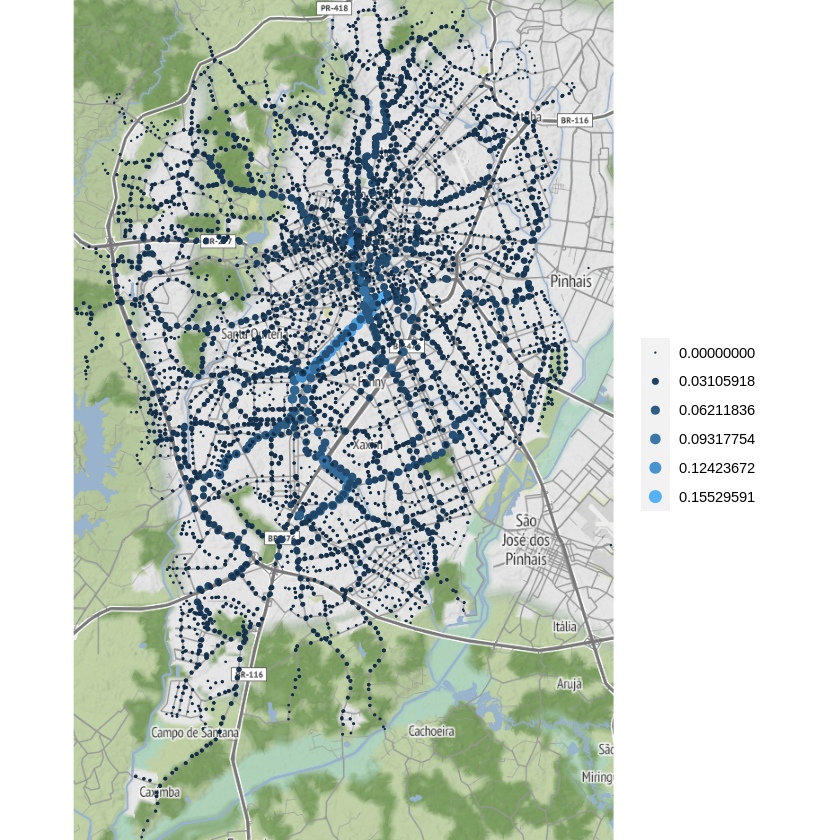

In [28]:
df_bus_stops <- data.frame(lat = V(curitiba_l)$lat,
                            lon = V(curitiba_l)$lon)

# choose: NA->unweighted NULL->weighted
ctba_betweeness <- betweenness(simplify(curitiba_l),
                            weight = NULL,
                            normalized = TRUE)

df_metrics <- df_bus_stops
df_metrics$value <- ctba_betweeness

ggmap(my_curitiba_v11, extent = 'device') +
    geom_point(data = df_metrics,
                aes(x = lon, y = lat,
                size = value, color = value)) +
    scale_size_continuous(range = c(0, 3),
                          breaks = my_break_function) +
    scale_color_gradient(breaks = my_break_function) +
    guides(size = guide_legend(title = NULL),
    color = guide_legend(title = NULL))

In [29]:
sort(ctba_betweeness, decreasing = TRUE)[1:10]

140053    150004    150006    150009    150248    150011    150013    150015 
0.1552959 0.1432563 0.1409343 0.1409266 0.1408597 0.1355832 0.1355258 0.1354745 
   150017    150019 
0.1354410 0.1354232

In [30]:
top10b_dados <- df_empty
top10b <- sort(ctba_betweeness, decreasing = TRUE)[1:10]

for (top10b in attributes(top10b))
    for (n in top10b)
    {
        top10b_dados <- rbind(top10b_dados, df_dados_paradas[df_dados_paradas$num == n,1:2])
    }

top10b_dados

,num,nome
,<chr>,<chr>
190,140053,"Rua Conselheiro Dantas, 356 - Prado Velho"
2375,150004,"Av. Pres. Kennedy, 601 - Rebouças"
2374,150006,"Av. Pres. Kennedy, 1013 - Rebouças"
2372,150009,"Av. Pres. Kennedy, 1727 - Guaíra"
2373,150248,"Av. Pres. Kennedy, 1351 - Parolin"
2371,150011,"Av. Pres. Kennedy, 2043 - Portão"
2370,150013,"Av. Pres. Kennedy, 2159 - Guaíra"
2369,150015,"Av. Pres. Kennedy, 2511 - Água Verde"
2368,150017,"Av. Pres. Kennedy, 2731 - Guaíra"


### 7. Quais os 10 pontos mais centrais do sistema de transporte?
    a. Closeness


ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



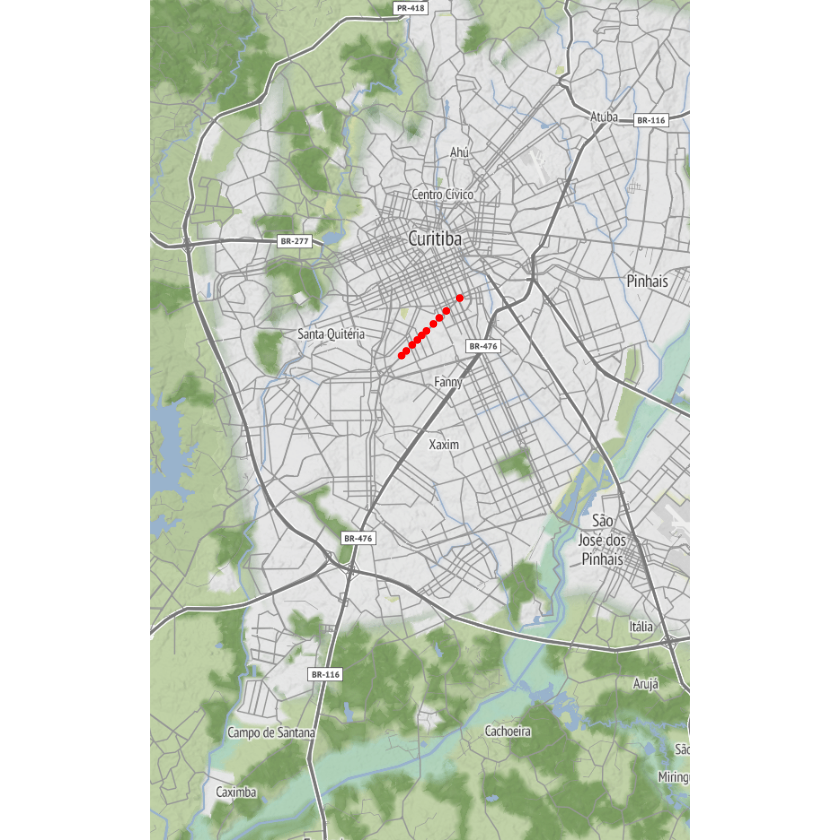

In [31]:
df_b_stops <- df_all_stops %>% filter(num %in% top10b_dados$num)

# plotting
a_delta = 0.001

city_region <- c(
    left = min(df_all_stops$lon)-a_delta,
    top = max(df_all_stops$lat)+a_delta,
    right = max(df_all_stops$lon)+a_delta,
    bottom = min(df_all_stops$lat)-a_delta)

my_curitiba_v21 <- get_map(location = city_region, zoom = 12, source='stamen')

ggmap(my_curitiba_v21, extent = 'device') +
    geom_point(aes(x = lon, y = lat),
                data = df_b_stops,
                color = 'red')


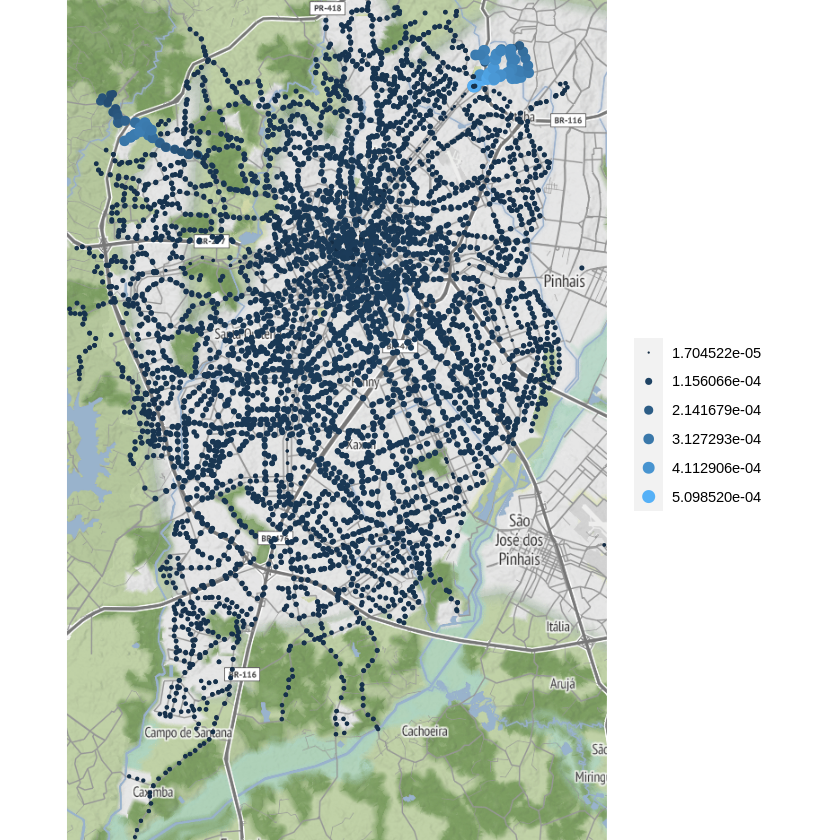

In [32]:
df_bus_stops <- data.frame(lat = V(curitiba_l)$lat,
                           lon = V(curitiba_l)$lon)

# choose: NA->unweighted NULL->weighted
ctba_closeness <- closeness(simplify(curitiba_l),
                                weight = NULL,
                                normalized = TRUE)

df_metrics <- df_bus_stops
df_metrics$value <- ctba_closeness

ggmap(my_curitiba_v11, extent = 'device') +
    geom_point(data = df_metrics,
               aes(x = lon, y = lat,
               size = value, color = value)) +
    scale_size_continuous(range = c(0, 3),
    breaks = my_break_function) +
    scale_color_gradient(breaks = my_break_function) +
    guides(size = guide_legend(title = NULL),
    color = guide_legend(title = NULL))

In [33]:
sort(ctba_closeness, decreasing = TRUE)[1:10]

130557       105908       120155       120457       120458       130558 
0.0005098520 0.0004975810 0.0004939227 0.0004798375 0.0004581304 0.0004568774 
      105906       105909       130566       130560 
0.0004494249 0.0004448093 0.0004430478 0.0004268888

In [34]:
top10c_dados <- df_empty
top10c <- sort(ctba_closeness, decreasing = TRUE)[1:10]

for (top10c in attributes(top10c))
    for (n in top10c)
    {
        top10c_dados <- rbind(top10c_dados, df_dados_paradas[df_dados_paradas$num == n,1:2])
    }

top10c_dados

,num,nome
,<chr>,<chr>
4272,130557,"Rua Padre João Wislinski, 621 - Santa Candida"
4342,105908,Terminal Santa Cândida - 233 - Olaria
4299,120155,"Rua Padre João Wislinski, 1048 - Santa Candida"
4344,120457,"Estrada Santa Cândida, 116 - Tingui"
4345,120458,"Estrada Santa Cândida, 303 - Tingui"
4273,130558,"Rua Máximo João Kop, 204 - Santa Candida"
4271,105906,Terminal Santa Cândida - 231 - Banestado / Califórnia
4300,105909,Terminal Santa Cândida - 231 - Banestado / Califórnia
4298,130566,"Estrada Santa Cândida, 111 - Tingui"


ℹ Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.



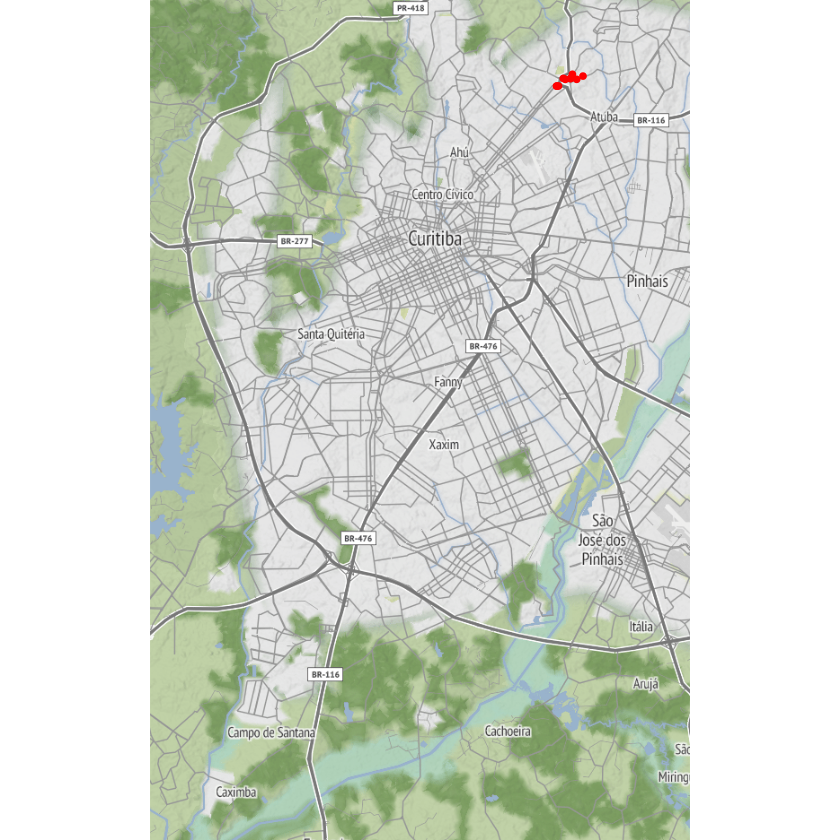

In [35]:
df_c_stops <- df_all_stops %>% filter(num %in% top10c_dados$num)

# plotting
a_delta = 0.001

city_region <- c(
    left = min(df_all_stops$lon)-a_delta,
    top = max(df_all_stops$lat)+a_delta,
    right = max(df_all_stops$lon)+a_delta,
    bottom = min(df_all_stops$lat)-a_delta)

my_curitiba_v21 <- get_map(location = city_region, zoom = 12, source='stamen')

ggmap(my_curitiba_v21, extent = 'device') +
    geom_point(aes(x = lon, y = lat),
                data = df_c_stops,
                color = 'red')

Warning message:
“The dot-dot notation (`..level..`) was deprecated in ggplot2 3.4.0.
ℹ Please use `after_stat(level)` instead.
ℹ The deprecated feature was likely used in the ggmap package.
  Please report the issue at <https://github.com/dkahle/ggmap/issues>.”
Warning message:
“The `guide` argument in `scale_*()` cannot be `FALSE`. This was deprecated in
ggplot2 3.3.4.
ℹ Please use "none" instead.
ℹ The deprecated feature was likely used in the ggmap package.
  Please report the issue at <https://github.com/dkahle/ggmap/issues>.”


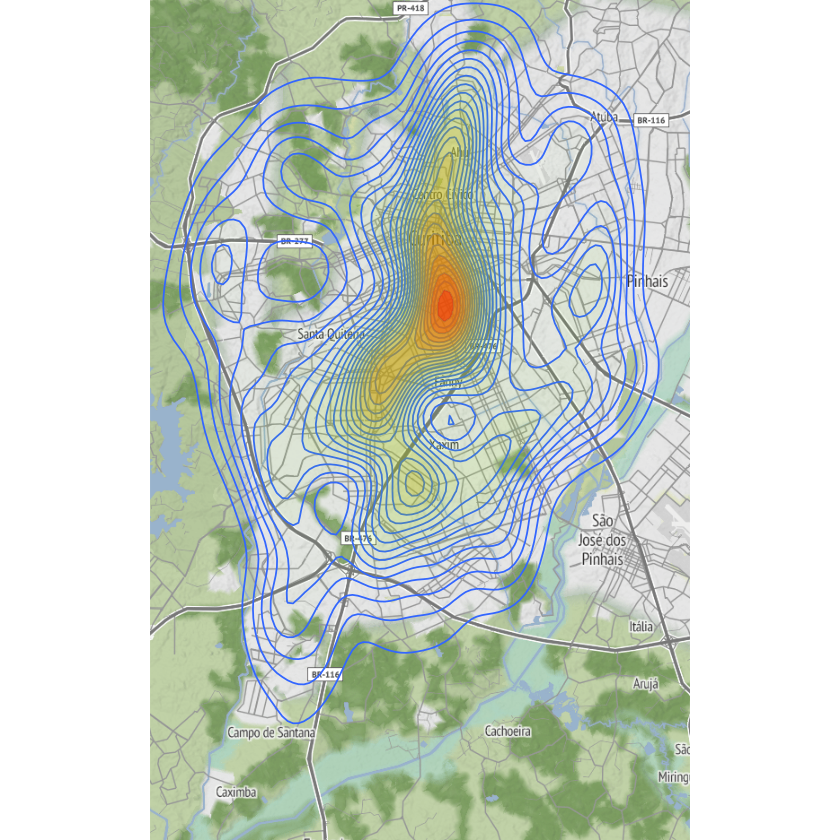

In [36]:
# Copied from MASS::kde2d and modified Ort Christoph
# https://stat.ethz.ch/pipermail/r-help/2006-June/107405.html
kde2d.weighted <- function (x, y, w, h, n = 25,
                           lims = c(range(x), range(y))) {
    nx <- length(x)

    if (length(y) != nx)
        stop("data vectors must be the same length")

    gx <- seq(lims[1], lims[2], length = n) # gridpoints x
    gy <- seq(lims[3], lims[4], length = n) # gridpoints y

    if (missing(h))
        h <- c(bandwidth.nrd(x), bandwidth.nrd(y));

    if (missing(w))
        w <- numeric(nx)+1;

    h <- h/4

    # distance of each point to each grid point in x-direction
    ax <- outer(gx, x, "-")/h[1]

    # distance of each point to each grid point in y-direction
    ay <- outer(gy, y, "-")/h[2]

    # z is the density
    z <- (matrix(rep(w,n), nrow=n, ncol=nx, byrow=TRUE) *
            matrix(dnorm(ax), n, nx)) %*%
        t(matrix(dnorm(ay), n, nx))/(sum(w) * h[1] * h[2])

    return(list(x = gx, y = gy, z = z))
}

df_bus_stops <- data.frame(lat = V(curitiba_l)$lat,
                            lon = V(curitiba_l)$lon)
# to correct a problem with our DATA

# (different bus stops with same lat/lon)
df_bus_stops$lat <- jitter(df_bus_stops$lat)

# choose: NA->unweighted NULL->weighted
ctba_betweeness <- betweenness(simplify(curitiba_l),
                            weight = NULL,
                            normalized = TRUE)

df_metrics <- df_bus_stops
df_metrics$value <- ctba_betweeness
a_density <- kde2d.weighted(df_metrics$lon,
                            df_metrics$lat,
                            df_metrics$value,
                            n=100)
df_density <- data.frame(
                        expand.grid(x = a_density$x,
                        y = a_density$y),
                        z = as.vector(a_density$z))

ggmap(my_curitiba_v11, extent = 'device') +
    geom_contour(data = df_density,
    aes(x = x, y = y, z = z), binwidth = 5) +
    stat_contour(data = df_density,
    aes(x = x, y = y, z = z,
    fill = ..level..,
    alpha = ..level..),
    geom = 'polygon') +
    scale_fill_gradient(low = 'green',
    high = 'red',
    guide = FALSE) +
    scale_alpha(range=c(0, 0.30), guide = FALSE)

In [37]:
curitiba_l


IGRAPH b966fd7 UNW- 6762 11385 -- 
+ attr: name (v/c), lat (v/n), lon (v/n), group (v/c), weight (e/n)
+ edges from b966fd7 (vertex names):
 [1] 190685--190825 190683--190685 190681--190683 190667--190669 190670--190668
 [6] 190684--190682 190686--190684 190687--190686 190535--190826 190533--190535
[11] 190531--190533 190529--190531 190527--190529 190525--190527 190528--190526
[16] 190530--190528 190532--190530 190534--190532 190536--190534 190537--190536
[21] 190538--190537 190539--190826 190539--190538 190514--190509 190519--190518
[26] 190521--190519 190523--190526 190523--190521 190554--190523 190555--190554
[31] 190558--190555 190559--190558 190561--190559 109672--190670 109672--190561
[36] 190674--109672 190676--190674 190678--190676 190675--190677 190673--190675
+ ... omitted several edges

In [38]:
curitiba_p <- make_empty_graph(directed = FALSE)

df_empty <- data.frame(from = character(0),
                      to = character(0))

for (i in 1:length(all_bus_info)) {
    num_of_directions <- length(all_bus_info[[i]][[4]])

    if (num_of_directions==0)
        next

    df_stops_per_line <- df_empty

    for (j in 1:num_of_directions) {
        paste(i)
        a_df <- all_bus_info[[i]][[4]][[j]][[2]]
        total_stops <- nrow(a_df)
        df_sub <- data.frame(from = a_df$NUM[1:nrow(a_df) - 1],
        to = a_df$NUM[-1])
        df_stops_per_line <- rbind(df_stops_per_line, df_sub)
    }

# Mudança para P-Space
    # curitiba_p <- curitiba_p +
    #     graph_from_data_frame(df_stops_per_line, directed = FALSE)
    pontos_0 <- c(df_stops_per_line$from, df_stops_per_line$from )
    pontos_1 <- pontos_0[!duplicated(pontos_0)]

    if (length(pontos_1) <= 2) {
        curitiba_p <- curitiba_p +
                      graph_from_data_frame(df_stops_per_line, directed = FALSE)
    }

    if (length(pontos_1) > 2) {
        pontos_2 <- combn(pontos_1, 2)
        df_p_space <- data.frame(from = pontos_2[1 ,], to = pontos_2[2 ,])
        curitiba_p <- curitiba_p + graph_from_data_frame( df_p_space, directed = FALSE )
    }
}

In [39]:
mean_distance(curitiba_p)

[1] 3.630703

In [40]:
diameter(curitiba_p)
diameter_stops <- get_diameter(curitiba_p)
diameter_stops

[1] 10

+ 11/6761 vertices, named, from 40cf9d8:
 [1] 108171 108026 108056 108212 108210 150204 140034 140224 140375 140398
[11] 105608

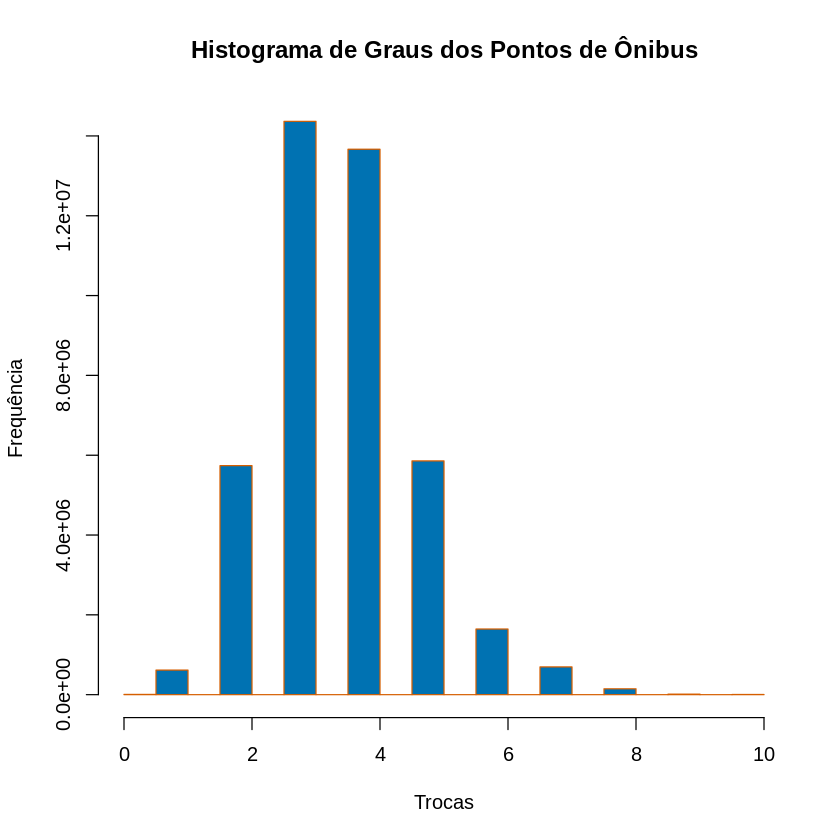

In [70]:
# Define cores personalizadas
hist_color <- "#0072B2"  # Azul
border_color <- "#D55E00"  # Laranja

# Plote o histograma com melhorias
hist(distances(curitiba_p),
     col = hist_color,  # Cor das barras
     border = border_color,  # Cor das bordas das barras
     main = 'Histograma de Graus dos Pontos de Ônibus',  # Título principal
     xlab = 'Trocas',  # Rótulo do eixo X
     ylab = 'Frequência',  # Rótulo do eixo Y
)

In [77]:
# Suponha que as métricas do seu exemplo sejam as seguintes
mean_dist <- mean_distance(curitiba_p)
diameter_value <- diameter(curitiba_p)

# Classifique a rede com base nas métricas e forneça uma descrição
if (mean_dist <= 1) {
  cat("A rede parece ser Aleatória.\n")
  cat("Isso ocorre porque a média de distância entre os nós é muito baixa, indicando que não há forte conexão entre eles, o que é característico de redes aleatórias.")
} else if (mean_dist <= 2 && diameter_value <= 10) {
  cat("A rede parece ser de Mundo Pequeno.\n")
  cat("Isso ocorre porque, apesar da média de distância não ser muito baixa, o diâmetro da rede também é pequeno. Nesse cenário, a rede exibe um equilíbrio entre conexões locais e distâncias curtas entre nós, característico de redes de mundo pequeno.")
} else {
  cat("A rede parece ser de Escala-Livre.\n")
  cat("Isso ocorre porque a média de distância é relativamente alta, indicando que a rede possui muitos nós com poucas conexões, mas também alguns nós com muitas conexões. Essa distribuição de graus segue um padrão de escala-livre.")
}

A rede parece ser de Escala-Livre.
Isso ocorre porque a média de distância é relativamente alta, indicando que a rede possui muitos nós com poucas conexões, mas também alguns nós com muitas conexões. Essa distribuição de graus segue um padrão de escala-livre.